### Import packages

In [2]:
import sys
sys.path.insert(0,'../..')
import os
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"   # see issue #152
os.environ["CUDA_VISIBLE_DEVICES"]="2"
import matplotlib.pyplot as plt
%matplotlib inline
import torch
import torch.nn as nn
import numpy as np
import torch.nn.functional as F
import torchattacks
import torchvision
from torchvision import transforms
from torchattacks.attack import Attack

### Import biotorch classes and functions

In [7]:
from biotorch.datasets.cifar import CIFAR10Benchmark
from biotorch.applications.adversarial_attacks.visualization import imshow, plot_accuracy
from biotorch.applications.adversarial_attacks.functions import add_data_normalization, apply_attack_on_dataset, apply_attack_on_batch 
from biotorch.layers.metrics import compute_matrix_angle

In [8]:
dataset = CIFAR10Benchmark(32, test_transforms=[
    transforms.transforms.Resize((32, 32)),
    transforms.ToTensor()])

cifar_mean = (0.4914, 0.4821, 0.4465)
cifar_std = (0.2470, 0.2435, 0.2616)

train_dataloader = dataset.create_train_dataloader(128)
val_dataloader = dataset.create_val_dataloader(128)
test_dataloader = dataset.create_test_dataloader(128)

Preparing CIFAR-10 Benchmark Dataset and storing data in ./datasets/cifar10
Files already downloaded and verified
Files already downloaded and verified
Files already downloaded and verified


### Define the models

In [9]:
trained_models_directory = '../trained_models/CIFAR10/resnet-20'

bp_model_path   = os.path.join(trained_models_directory, 'bp/model_best_acc.pth')
fa_model_path   = os.path.join(trained_models_directory, 'fa/model_best_acc.pth')
dfa_model_path  = os.path.join(trained_models_directory, 'dfa/model_best_acc.pth')
sign_usf_model_path = os.path.join(trained_models_directory, 'sign_usf/model_best_acc.pth')
sign_frsf_model_path = os.path.join(trained_models_directory, 'sign_frsf/model_best_acc.pth')
sign_brsf_model_path = os.path.join(trained_models_directory, 'sign_brsf/model_best_acc.pth')

In [10]:
model_bp = torch.load(bp_model_path, map_location='cuda:0')
model_bp = add_data_normalization(model_bp, cifar_mean, cifar_std).eval()

model_fa = torch.load(fa_model_path, map_location='cuda:0')
model_fa = add_data_normalization(model_fa, cifar_mean, cifar_std).eval()

model_dfa = torch.load(dfa_model_path, map_location='cuda:0')
model_dfa = add_data_normalization(model_dfa, cifar_mean, cifar_std).eval()

model_sign_usf = torch.load(sign_usf_model_path, map_location='cuda:0')
model_sign_usf = add_data_normalization(model_sign_usf, cifar_mean, cifar_std).eval()

model_sign_frsf = torch.load(sign_frsf_model_path, map_location='cuda:0')
model_sign_frsf = add_data_normalization(model_sign_frsf, cifar_mean, cifar_std).eval()

model_sign_brsf = torch.load(sign_brsf_model_path, map_location='cuda:0')
model_sign_brsf = add_data_normalization(model_sign_brsf, cifar_mean, cifar_std).eval()


In [11]:
class TPGD(Attack):
    r"""
    PGD based on KL-Divergence loss in the paper 'Theoretically Principled Trade-off between Robustness and Accuracy'
    [https://arxiv.org/abs/1901.08573]
    Distance Measure : Linf
    Arguments:
        model (nn.Module): model to attack.
        eps (float): strength of the attack or maximum perturbation. (Default: 8/255)
        alpha (float): step size. (Default: 2/255)
        steps (int): number of steps. (Default: 7)
    Shape:
        - images: :math:`(N, C, H, W)` where `N = number of batches`, `C = number of channels`,        `H = height` and `W = width`. It must have a range [0, 1].
        - output: :math:`(N, C, H, W)`.
    Examples::
        >>> attack = torchattacks.TPGD(model, eps=8/255, alpha=2/255, steps=7)
        >>> adv_images = attack(images)
    """
    def __init__(self, model, mode='bp', eps=8/255, alpha=2/255, steps=7):
        super().__init__("TPGD", model)
        self.eps = eps
        self.alpha = alpha
        self.steps = steps
        self._supported_mode = ['default']
        self.mode = mode

    def forward(self, images, labels=None):
        r"""
        Overridden.
        """
        images = images.clone().detach().to(self.device)
        logit_ori = self.model(images).detach()
        labels = F.softmax(logit_ori, dim=1)
        
        adv_images = images + 0.001*torch.randn_like(images)
        adv_images = torch.clamp(adv_images, min=0, max=1).detach()

        loss = nn.KLDivLoss(reduction='sum')

        for _ in range(self.steps):
            adv_images.requires_grad = True
            logit_adv = self.model(adv_images)
            outputs = F.log_softmax(logit_adv, dim=1)
            # Calculate loss
            cost = loss(outputs, labels)
            
            if self.mode == 'DFA':
                # Zero gradients
                self.model.zero_grad()
                loss_gradient = torch.autograd.grad(cost, outputs, retain_graph=True)[0]
                # Broadcast gradient of the loss to every layer
                for layer in self.model[1].module.modules():
                    layer.loss_gradient = loss_gradient

                cost.backward()
                grad = adv_images.grad
        
            else:
                # Update adversarial images
                grad = torch.autograd.grad(cost, adv_images,
                                       retain_graph=False, create_graph=False)[0]

            adv_images = adv_images.detach() + self.alpha*grad.sign()
            delta = torch.clamp(adv_images - images, min=-self.eps, max=self.eps)
            adv_images = torch.clamp(images + delta, min=0, max=1).detach()

        return adv_images

In [12]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu") 

### Run the TPGD attack

In [13]:
epsilons = np.linspace(0., 0.1, num=30)

In [14]:
attack_bp = TPGD(model_bp)
model_bp = model_bp.to(device)
clean_accuracy_bp, robust_accuracy_bp = apply_attack_on_dataset(model_bp, test_dataloader, 
                                                                attack_bp, epsilons, device, verbose=False)

Clean accuracy:  0.91109574


In [15]:
attack_fa = TPGD(model_fa)
model_fa = model_fa.to(device)
clean_accuracy_fa, robust_accuracy_fa = apply_attack_on_dataset(model_fa, test_dataloader, 
                                                                attack_fa, epsilons, device, verbose=False)

Clean accuracy:  0.679193


In [16]:
attack_dfa = TPGD(model_dfa, mode='DFA')
model_dfa = model_dfa.to(device)
clean_accuracy_dfa, robust_accuracy_dfa = apply_attack_on_dataset(model_dfa, test_dataloader, 
                                                                attack_dfa, epsilons, device, verbose=False)

/home/mohamed/workspace/biotorch/.venv/lib/python3.8/site-packages/torch/nn/modules/module.py:974: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Clean accuracy:  0.5403481


In [17]:
attack_sign_usf = TPGD(model_sign_usf)
model_sign_usf = model_sign_usf.to(device)
clean_accuracy_sign_usf, robust_accuracy_sign_usf = apply_attack_on_dataset(model_sign_usf, test_dataloader, 
                                                                attack_sign_usf, epsilons, device, verbose=False)

Clean accuracy:  0.89912975


In [18]:
attack_sign_frsf = TPGD(model_sign_frsf)
model_sign_frsf = model_sign_frsf.to(device)
clean_accuracy_sign_frsf, robust_accuracy_sign_frsf = apply_attack_on_dataset(model_sign_frsf, test_dataloader, 
                                                                attack_sign_frsf, epsilons, device, verbose=False)

Clean accuracy:  0.88854825


In [19]:
attack_sign_brsf = TPGD(model_sign_brsf)
model_sign_brsf = model_sign_brsf.to(device)
clean_accuracy_sign_brsf, robust_accuracy_sign_brsf = apply_attack_on_dataset(model_sign_brsf, test_dataloader, 
                                                                attack_sign_brsf, epsilons, device, verbose=False)

Clean accuracy:  0.88953716


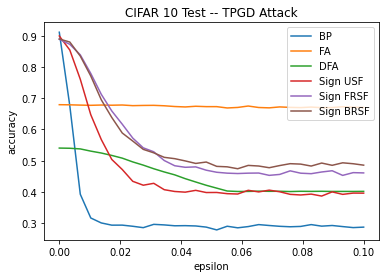

In [20]:
plot_accuracy(epsilons, 
              [
                  robust_accuracy_bp,
                  robust_accuracy_fa, 
                  robust_accuracy_dfa, 
                  robust_accuracy_sign_usf,
                  robust_accuracy_sign_frsf,
                  robust_accuracy_sign_brsf,
                            ], 
              ['BP', 'FA', 'DFA', 'Sign USF', 'Sign FRSF', 'Sign BRSF'],
              'CIFAR 10 Test -- TPGD Attack',
             'epsilon')

### Run the TPGD attack on a batch of the test set

In [22]:
images, labels = iter(test_dataloader).next()

In [23]:
adv_images_fa, success_fa, accuracy_clean_fa, accuracy_robust_fa = apply_attack_on_batch(model_fa, images, labels, attack_fa, device)
plot_images_fa = images[success_fa]
plot_images_adv_fa = adv_images_fa[success_fa]

Clean Accuracy on Batch: 0.6875%
Robust Accuracy on Batch: 0.671875%


In [24]:
adv_images_bp, success_bp, accuracy_clean_bp, accuracy_robust_bp = apply_attack_on_batch(model_bp, images, labels, attack_bp, device)
plot_images_bp = images[success_bp]
plot_images_adv_bp = adv_images_bp[success_bp]

Clean Accuracy on Batch: 0.921875%
Robust Accuracy on Batch: 0.3359375%


In [25]:
adv_images_sign_usf, success_sign_usf, accuracy_clean_sign_usf, accuracy_robust_sign_usf = \
    apply_attack_on_batch(model_sign_usf, images, labels, attack_sign_usf, device)
plot_images_sign_usf = images[success_sign_usf]
plot_images_adv_sign_usf = adv_images_sign_usf[success_sign_usf]

Clean Accuracy on Batch: 0.9453125%
Robust Accuracy on Batch: 0.40625%


In [26]:
adv_images_sign_brsf, success_sign_brsf, accuracy_clean_sign_brsf, accuracy_robust_sign_brsf = \
    apply_attack_on_batch(model_sign_brsf, images, labels, attack_sign_brsf, device)
plot_images_sign_brsf = images[success_sign_brsf]
plot_images_adv_sign_brsf = adv_images_sign_brsf[success_sign_brsf]

Clean Accuracy on Batch: 0.9140625%
Robust Accuracy on Batch: 0.5%


In [27]:
adv_images_sign_frsf, success_sign_frsf, accuracy_clean_sign_frsf, accuracy_robust_sign_frsf = \
    apply_attack_on_batch(model_sign_frsf, images, labels, attack_sign_frsf, device)
plot_images_sign_frsf = images[success_sign_frsf]
plot_images_adv_sign_frsf = adv_images_sign_frsf[success_sign_frsf]

Clean Accuracy on Batch: 0.9140625%
Robust Accuracy on Batch: 0.4609375%


In [28]:
adv_images_dfa, success_dfa, accuracy_clean_dfa, accuracy_robust_dfa = apply_attack_on_batch(model_dfa, images, labels, attack_dfa, device)
plot_images_dfa = images[success_dfa]
plot_images_adv_dfa = adv_images_dfa[success_dfa]

/home/mohamed/workspace/biotorch/.venv/lib/python3.8/site-packages/torch/nn/modules/module.py:974: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Clean Accuracy on Batch: 0.5546875%
Robust Accuracy on Batch: 0.4296875%


### Plot the adversarial images

In [29]:
n_adv = 64

#### BP

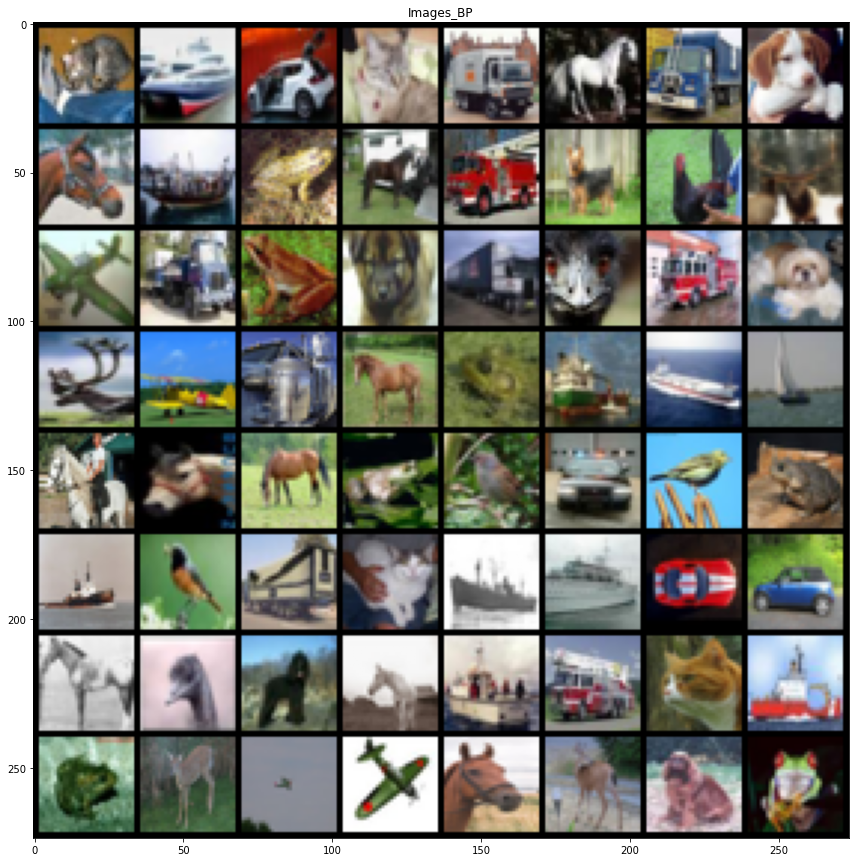

In [30]:
imshow(torchvision.utils.make_grid(plot_images_bp[0:n_adv], normalize=False), "Images_BP")

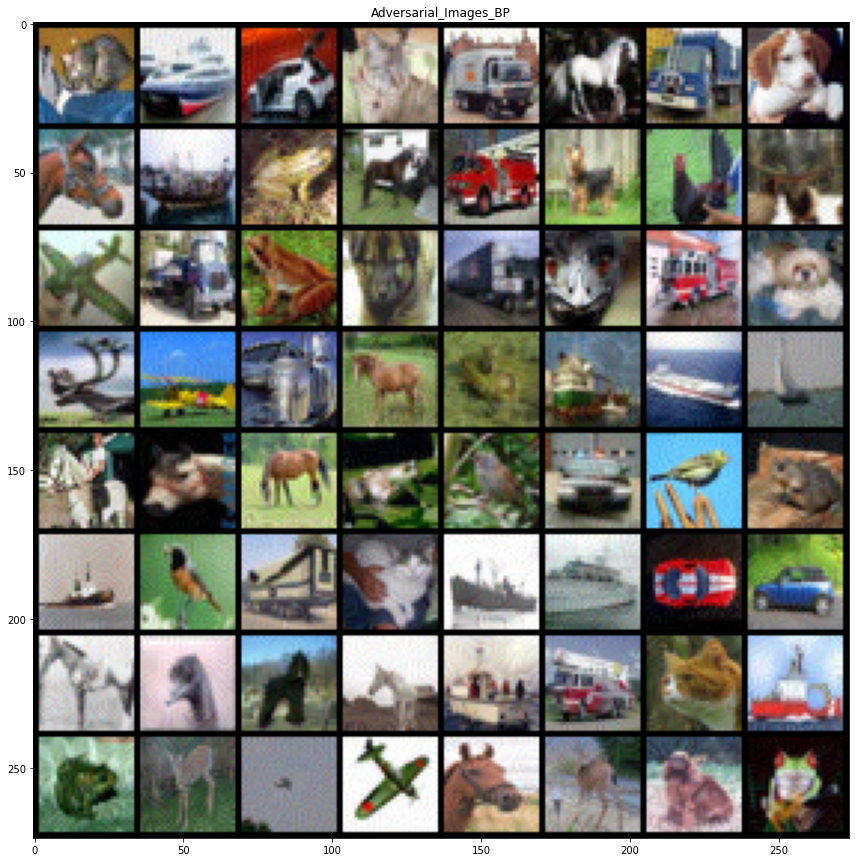

In [31]:
imshow(torchvision.utils.make_grid(plot_images_adv_bp[0:n_adv], normalize=False), "Adversarial_Images_BP")

#### FA

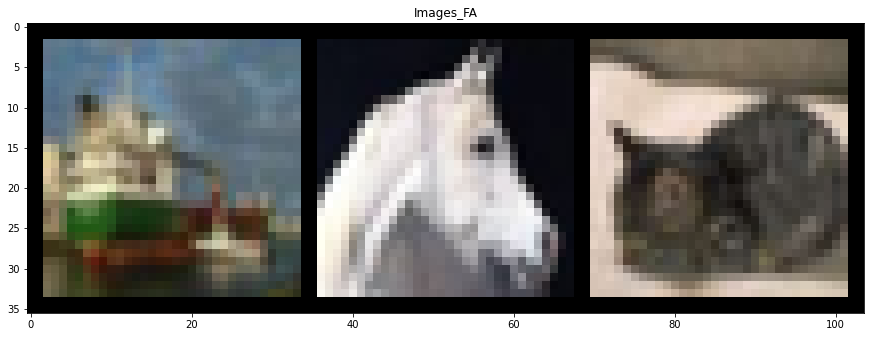

In [32]:
imshow(torchvision.utils.make_grid(plot_images_fa[0:n_adv], normalize=False), "Images_FA")

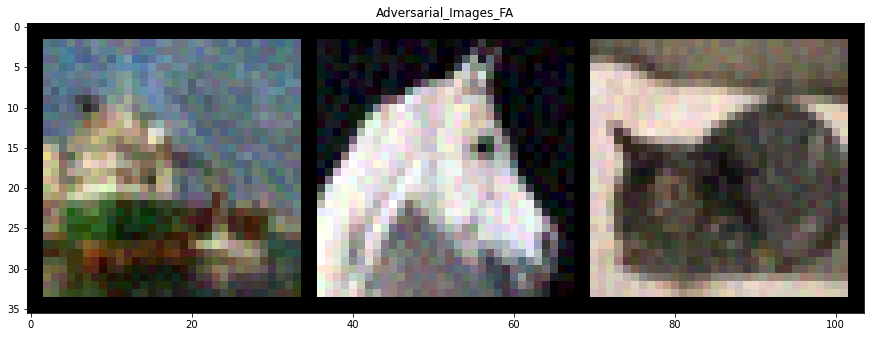

In [33]:
imshow(torchvision.utils.make_grid(plot_images_adv_fa[0:n_adv], normalize=False), "Adversarial_Images_FA")

#### DFA

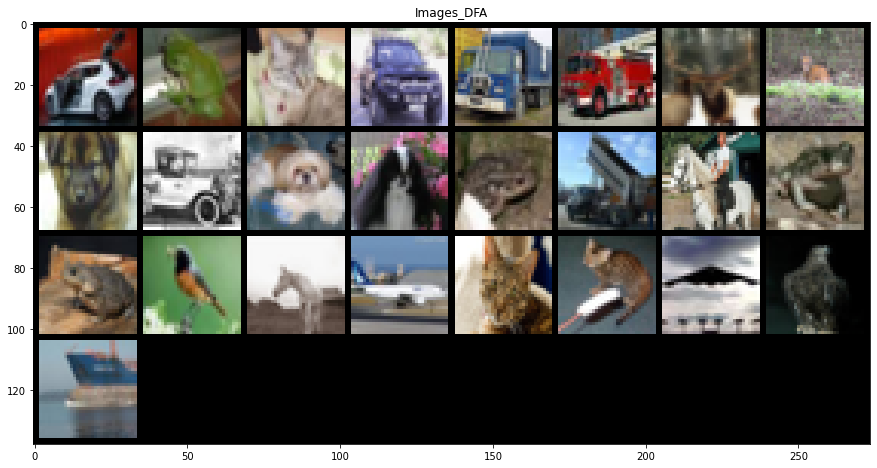

In [34]:
imshow(torchvision.utils.make_grid(plot_images_dfa[0:n_adv], normalize=False), "Images_DFA")

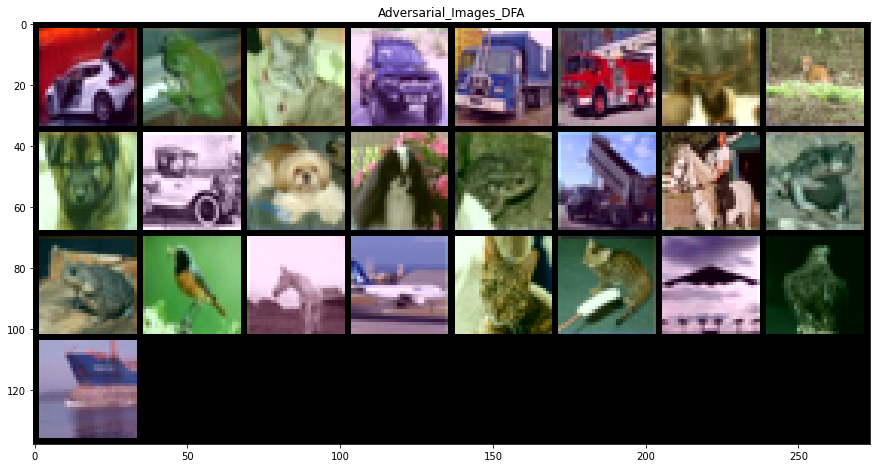

In [35]:
imshow(torchvision.utils.make_grid(plot_images_adv_dfa[0:n_adv], normalize=False), "Adversarial_Images_DFA")

#### Sign USF

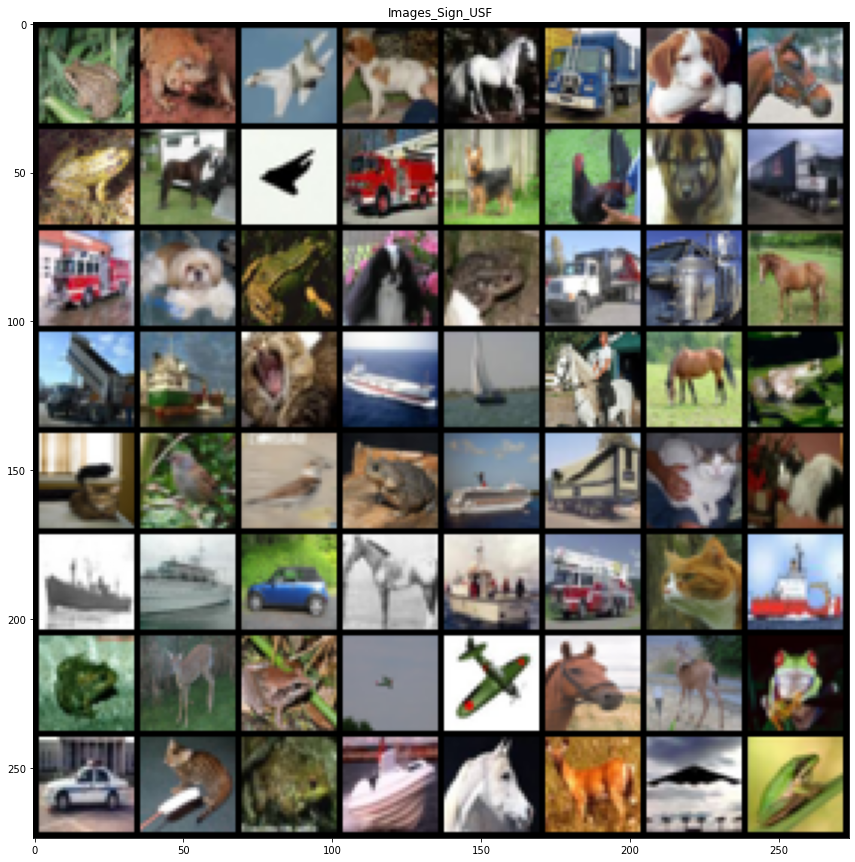

In [36]:
imshow(torchvision.utils.make_grid(plot_images_sign_usf[0:n_adv], normalize=False), "Images_Sign_USF")

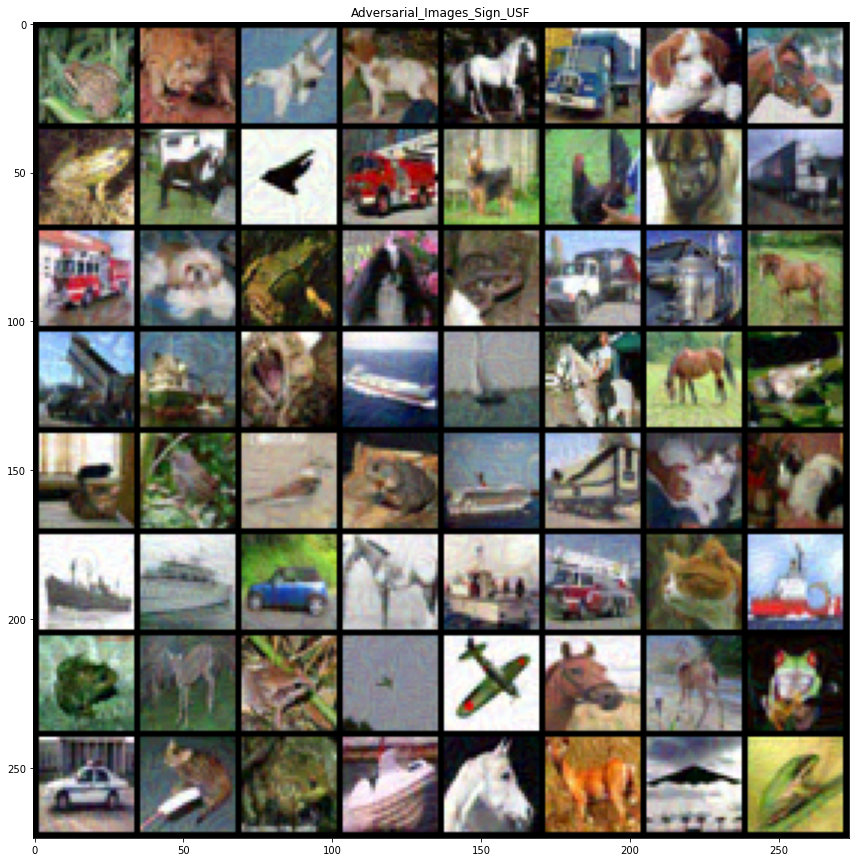

In [37]:
imshow(torchvision.utils.make_grid(plot_images_adv_sign_usf[0:n_adv], normalize=False), "Adversarial_Images_Sign_USF")

#### Sign BRSF

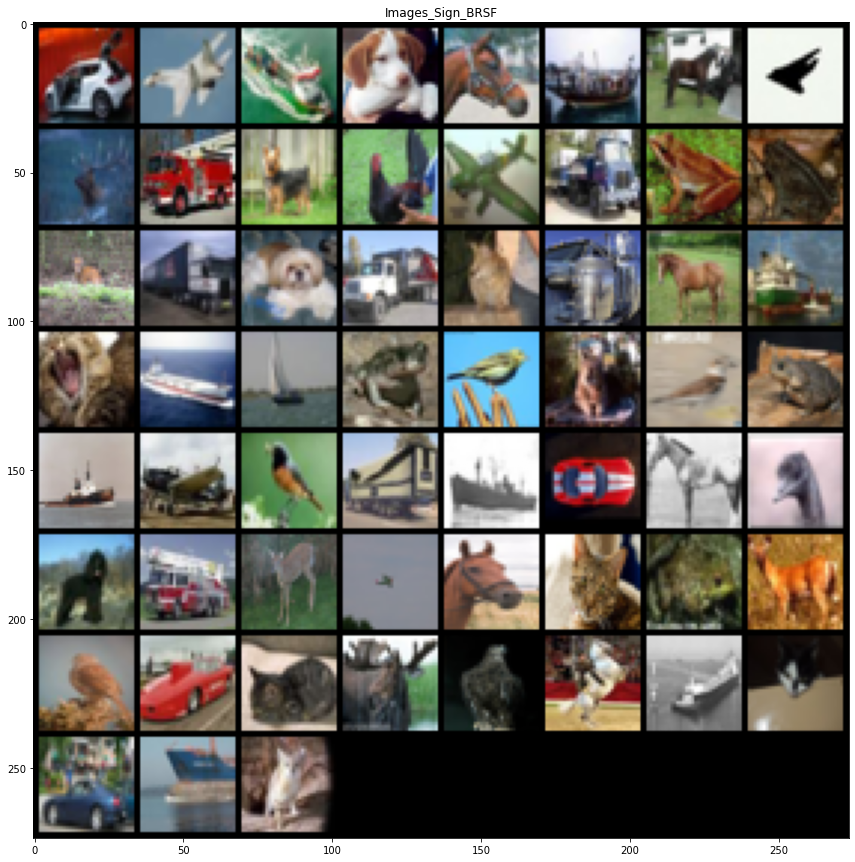

In [38]:
imshow(torchvision.utils.make_grid(plot_images_sign_brsf[0:n_adv], normalize=False), "Images_Sign_BRSF")

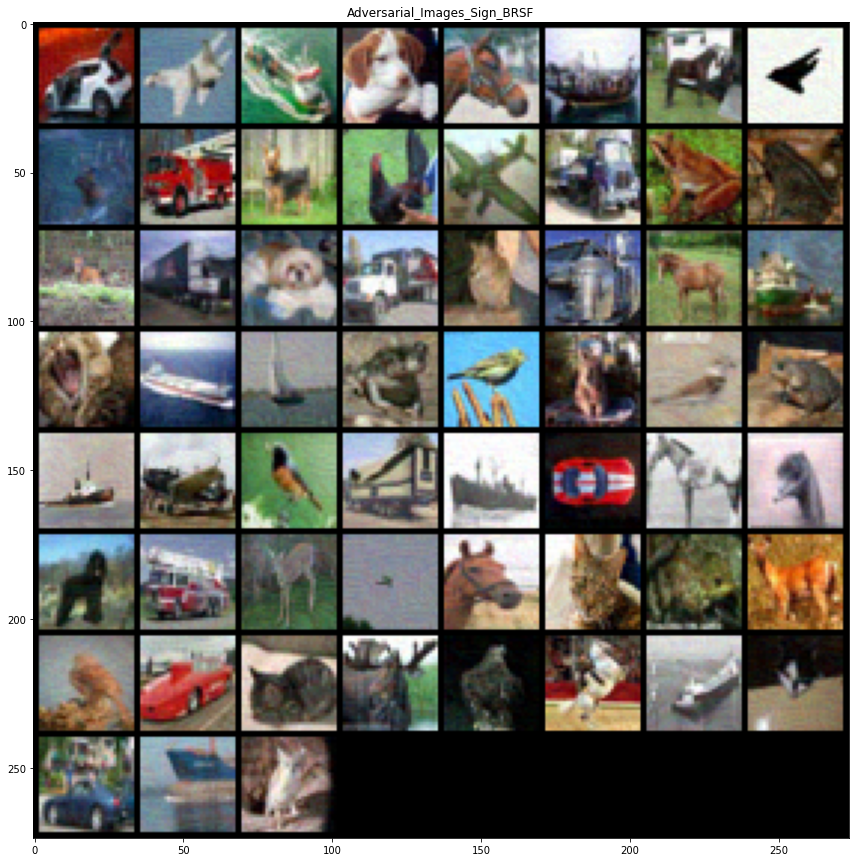

In [39]:
imshow(torchvision.utils.make_grid(plot_images_adv_sign_brsf[0:n_adv], normalize=False), "Adversarial_Images_Sign_BRSF")

#### Sign FRSF

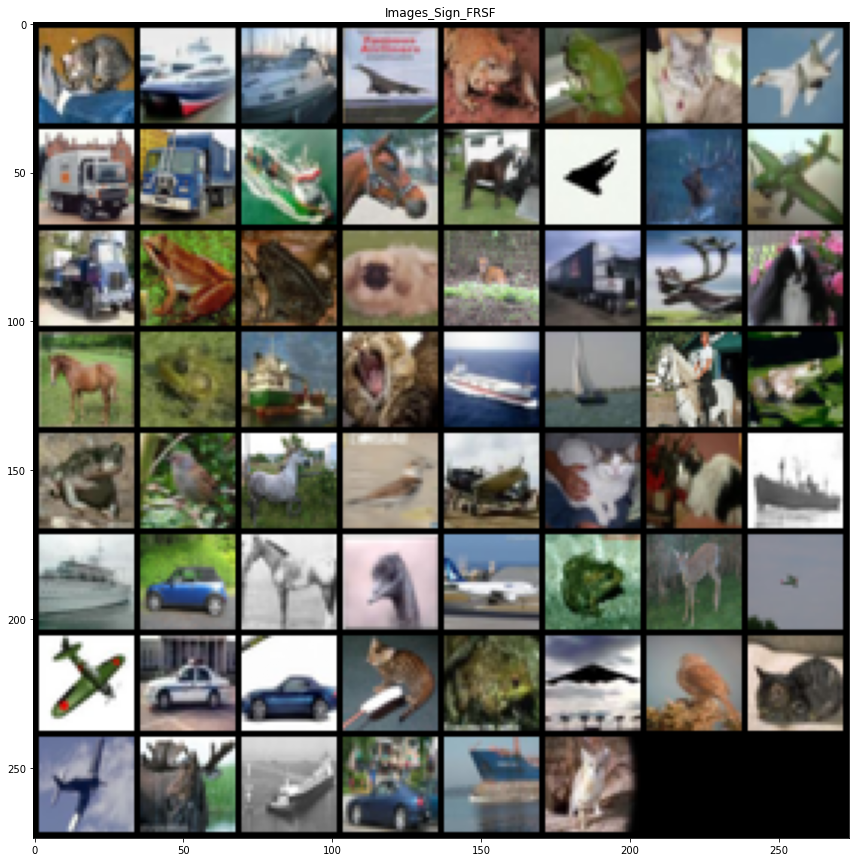

In [40]:
imshow(torchvision.utils.make_grid(plot_images_sign_frsf[0:n_adv], normalize=False), "Images_Sign_FRSF")

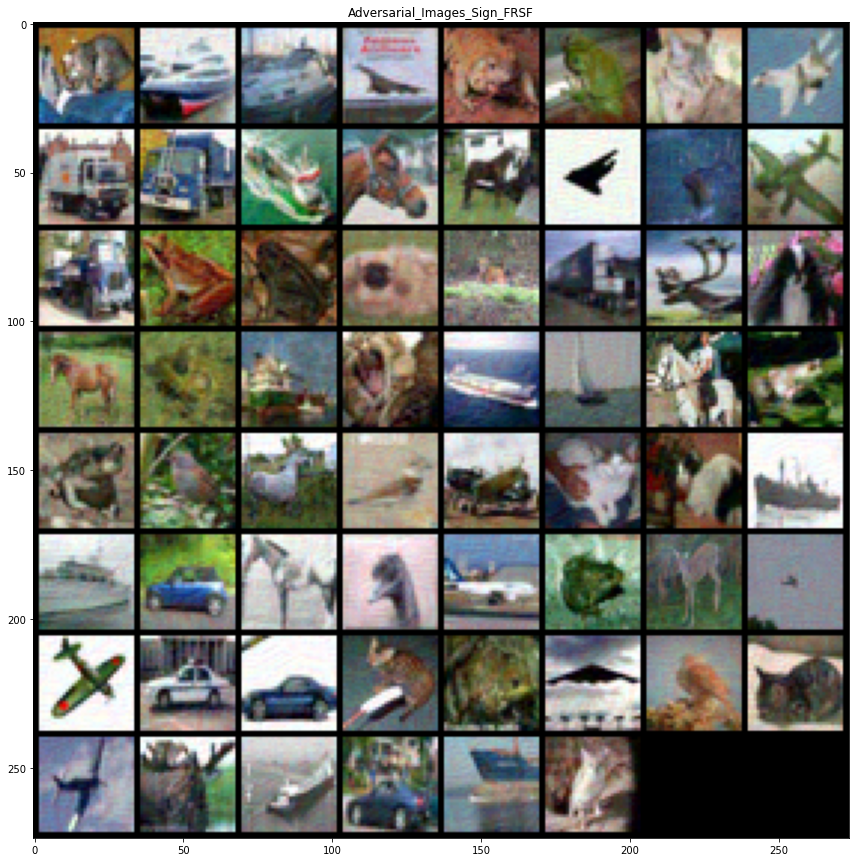

In [41]:
imshow(torchvision.utils.make_grid(plot_images_adv_sign_frsf[0:n_adv], normalize=False), "Adversarial_Images_Sign_FRSF")